## Mouse Spleen

In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import seaborn as sns
import torch
from sklearn.utils import shuffle
from scipy.stats import pearsonr
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
config = {
    "font.family":'Times New Roman',  # 设置字体类型
    "font.size":22,
    "axes.unicode_minus": False #解决负号无法显示的问题
}
rcParams.update(config)

/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: 

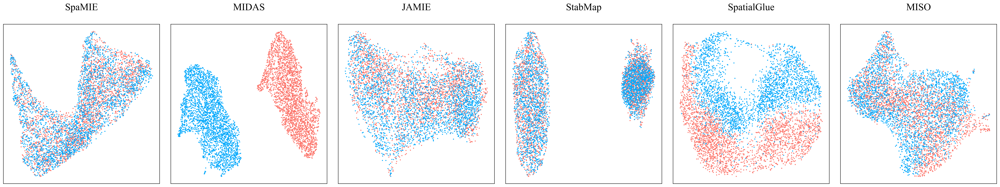

In [2]:
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

def plot_batch_umap(adata, rep_key, ax, title):

    adata_rep = ad.AnnData(X=adata.obsm[rep_key])
 
    batch_labels = ['1'] * 2653 + ['2'] * (adata.shape[0] - 2653)
    adata_rep.obs['batch'] = batch_labels

    adata_rep.uns['batch_colors'] = ['#FC746A', '#05A9FC']  # 红/蓝配色

    sc.pp.neighbors(adata_rep, use_rep='X', n_neighbors=10)
    sc.tl.umap(adata_rep)

    sc.pl.umap(adata_rep, color='batch', ax=ax, s=20, title='', show=False)
    ax.get_legend().remove()
    ax.set_xlabel('')
    ax.set_ylabel('')
    return adata_rep

path = '/data/xiangdw/data/data/spots/' 

adata = sc.read_h5ad(path + 'Spots_methods_2batch_concat.h5ad')

methods = [
    ('SpaMIE', 'SpaMIE'),
    ('MIDAS', 'MIDAS'),
    ('JAMIE', 'JAMIE'),
    ('StabMap', 'StabMap'),
    ('SpatialGlue', 'SpatialGlue'),
    ('MISO', 'MISO'),
]

fig = plt.figure(figsize=(30, 6),dpi=400)
gs = GridSpec(1, 6, figure=fig)

titles = ['SpaMIE', 'MIDAS','JAMIE', 'StabMap',  'SpatialGlue', 'MISO']

for i, (rep_key, _) in enumerate(methods):
    ax = fig.add_subplot(gs[0, i])
    _ = plot_batch_umap(adata, rep_key, ax, "")
    
    ax.set_title(titles[i], fontsize=21, pad=30) 
plt.tight_layout()
plt.show()

In [2]:
from sklearn.metrics import (adjusted_rand_score, normalized_mutual_info_score, adjusted_mutual_info_score, 
                             mutual_info_score, homogeneity_score, homogeneity_completeness_v_measure)


def ARI_metric(labels_true, labels_pred): 
 ari = adjusted_rand_score(labels_true, labels_pred)  
 return ari


def NMI_metric(labels_true, labels_pred): 
 NMI = normalized_mutual_info_score(labels_true, labels_pred)  
 return NMI

def AMI_metric(labels_true, labels_pred): 
 AMI = adjusted_mutual_info_score(labels_true, labels_pred)  
 return AMI

def MIS_metric(labels_true, labels_pred): 
 MIS = mutual_info_score(labels_true, labels_pred)  
 return MIS

def HS_metric(labels_true, labels_pred): 
 HS = homogeneity_score(labels_true, labels_pred)  
 return HS

def VM_metric(labels_true, labels_pred): 
 VM = homogeneity_completeness_v_measure(labels_true, labels_pred)  
 return VM


In [3]:
import pandas as pd
path =  '/data/xiangdw/data/data/spots/' 


def calculate_metrics (adata, domain, target_key):
    metrics = []
    metrics.append(ARI_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(NMI_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(AMI_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(MIS_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(HS_metric(adata.obs[domain], adata.obs[target_key]))
    return metrics

metric_all = pd.DataFrame()

for i in ('_1', '_2'): 
    adata1 = sc.read_h5ad(path + 'Spots_methods_2batch_concat.h5ad')
    SpaMIE_metric = {}
    SpatialGlue_metric = {}
    COSMOS_metric = {}
    SpaVAE_metric = {}
    Mefisto_metric = {}
    MISO_metric = {}
    MIDAS_metric = {}
    JAMIE_metric = {}
    SpaMosaic_metric = {}
    StabMap_metric = {}



    i = ''
    # 对每种方法计算指标并存储在相应的字典中
    for method in ('SpaMIE'+i,  'SpatialGlue'+i, 'COSMOS'+i, 'SpaVAE', 'Mefisto'+i, 'MISO'+i,'MIDAS'+i,'JAMIE'+i,'SpaMosaic'+i,'StabMap'):
        metrics_list = calculate_metrics(adata1, 'STAligner_ADT', method) # STAligner_ADT GraphPCA_ADT_K
        if method == 'SpaMIE'+i:
            SpaMIE_metric['SpaMIE'] = metrics_list
        elif method == 'SpaVAE' :
            SpaVAE_metric['spaMultiVAE'] = metrics_list
        elif method == 'COSMOS'+i:
            COSMOS_metric['COSMOS'] = metrics_list
        elif method == 'SpatialGlue'+i:
            SpatialGlue_metric['SpatialGlue'] = metrics_list
        elif method == 'Mefisto'+i:
            Mefisto_metric['MEFISTO'] = metrics_list
        elif method == 'MISO'+i:
            MISO_metric['MISO'] = metrics_list
        elif method == 'JAMIE'+i:
            JAMIE_metric['JAMIE'] = metrics_list
        elif method == 'MIDAS'+i:
            MIDAS_metric['MIDAS'] = metrics_list
        elif method == 'SpaMosaic'+i:
            SpaMosaic_metric['SpaMosaic'] = metrics_list
        elif method == 'StabMap'+i:
            StabMap_metric['StabMap'] = metrics_list

    
    
    metric = {"Metric":['ARI','NMI','AMI','MIS','HS']}
    d = {}
    d = {**SpaMIE_metric, **SpatialGlue_metric,    **COSMOS_metric,**JAMIE_metric, **MIDAS_metric, **StabMap_metric, **SpaVAE_metric,
         **Mefisto_metric, **MISO_metric, } 
    d =pd.DataFrame(d,index=['ARI','NMI','AMI','MIS','HS'])
    metric_all = pd.concat([metric_all, d], axis=0)
metric_all



,SpaMIE,SpatialGlue,COSMOS,JAMIE,MIDAS,StabMap,spaMultiVAE,MEFISTO,MISO
ARI,0.345056,0.224259,0.198134,0.267540,0.186398,0.034542,0.129822,0.141095,0.182380
NMI,0.411169,0.308982,0.228738,0.296737,0.289227,0.036872,0.142057,0.263194,0.249437
AMI,0.410619,0.308323,0.227992,0.296045,0.288566,0.035978,0.141237,0.262488,0.248655
MIS,0.651048,0.479257,0.350466,0.446817,0.460144,0.058693,0.219925,0.406593,0.363607
HS,0.405731,0.298672,0.218410,0.278455,0.286761,0.036577,0.137057,0.253388,0.226599
ARI,0.345056,0.224259,0.198134,0.267540,0.186398,0.034542,0.129822,0.141095,0.182380
NMI,0.411169,0.308982,0.228738,0.296737,0.289227,0.036872,0.142057,0.263194,0.249437
AMI,0.410619,0.308323,0.227992,0.296045,0.288566,0.035978,0.141237,0.262488,0.248655
MIS,0.651048,0.479257,0.350466,0.446817,0.460144,0.058693,0.219925,0.406593,0.363607
HS,0.405731,0.298672,0.218410,0.278455,0.286761,0.036577,0.137057,0.253388,0.226599


In [7]:
import pandas as pd
path =  '/data/xiangdw/data/data/spots/' 


def calculate_metrics (adata, domain, target_key):
    metrics = []
    metrics.append(ARI_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(NMI_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(AMI_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(MIS_metric(adata.obs[domain], adata.obs[target_key]))
    metrics.append(HS_metric(adata.obs[domain], adata.obs[target_key]))
    return metrics

metric_all_RNA = pd.DataFrame()

for i in ('_1', '_2'): 
    adata1 = sc.read_h5ad(path + 'Spots_methods_2batch_concat.h5ad')
    SpaMIE_metric = {}
    SpatialGlue_metric = {}
    COSMOS_metric = {}
    SpaVAE_metric = {}
    Mefisto_metric = {}
    MISO_metric = {}
    MIDAS_metric = {}
    JAMIE_metric = {}
    SpaMosaic_metric = {}


    i = ''
    # 对每种方法计算指标并存储在相应的字典中
    for method in ('SpaMIE'+i,  'SpatialGlue'+i, 'COSMOS'+i, 'SpaVAE', 'Mefisto'+i, 'MISO'+i,'MIDAS'+i,'JAMIE'+i,'SpaMosaic'+i,'StabMap'+i):
        metrics_list = calculate_metrics(adata1, 'STAligner_RNA', method) # STAligner_RNA GraphPCA_RNA_K
        if method == 'SpaMIE'+i:
            SpaMIE_metric['SpaMIE'] = metrics_list
        elif method == 'SpaVAE' :
            SpaVAE_metric['spaMultiVAE'] = metrics_list
        elif method == 'COSMOS'+i:
            COSMOS_metric['COSMOS'] = metrics_list
        elif method == 'SpatialGlue'+i:
            SpatialGlue_metric['SpatialGlue'] = metrics_list
        elif method == 'Mefisto'+i:
            Mefisto_metric['MEFISTO'] = metrics_list
        elif method == 'MISO'+i:
            MISO_metric['MISO'] = metrics_list
        elif method == 'JAMIE'+i:
            JAMIE_metric['JAMIE'] = metrics_list
        elif method == 'MIDAS'+i:
            MIDAS_metric['MIDAS'] = metrics_list
        elif method == 'SpaMosaic'+i:
            SpaMosaic_metric['SpaMosaic'] = metrics_list
        elif method == 'StabMap'+i:
            StabMap_metric['StabMap'] = metrics_list

    
    
    metric = {"Metric":['ARI','NMI','AMI','MIS','HS']}
    d = {}
    d = {**SpaMIE_metric, **SpatialGlue_metric,    **COSMOS_metric,**JAMIE_metric, **MIDAS_metric, **StabMap_metric, **SpaVAE_metric,
         **Mefisto_metric, **MISO_metric, } 
    d =pd.DataFrame(d,index=['ARI','NMI','AMI','MIS','HS'])
    metric_all_RNA = pd.concat([metric_all, d], axis=0)
metric_all_RNA



,SpaMIE,SpatialGlue,COSMOS,JAMIE,MIDAS,StabMap,spaMultiVAE,MEFISTO,MISO
ARI,0.345056,0.224259,0.198134,0.267540,0.186398,0.034542,0.129822,0.141095,0.182380
NMI,0.411169,0.308982,0.228738,0.296737,0.289227,0.036872,0.142057,0.263194,0.249437
AMI,0.410619,0.308323,0.227992,0.296045,0.288566,0.035978,0.141237,0.262488,0.248655
MIS,0.651048,0.479257,0.350466,0.446817,0.460144,0.058693,0.219925,0.406593,0.363607
HS,0.405731,0.298672,0.218410,0.278455,0.286761,0.036577,0.137057,0.253388,0.226599
ARI,0.345056,0.224259,0.198134,0.267540,0.186398,0.034542,0.129822,0.141095,0.182380
NMI,0.411169,0.308982,0.228738,0.296737,0.289227,0.036872,0.142057,0.263194,0.249437
AMI,0.410619,0.308323,0.227992,0.296045,0.288566,0.035978,0.141237,0.262488,0.248655
MIS,0.651048,0.479257,0.350466,0.446817,0.460144,0.058693,0.219925,0.406593,0.363607
HS,0.405731,0.298672,0.218410,0.278455,0.286761,0.036577,0.137057,0.253388,0.226599


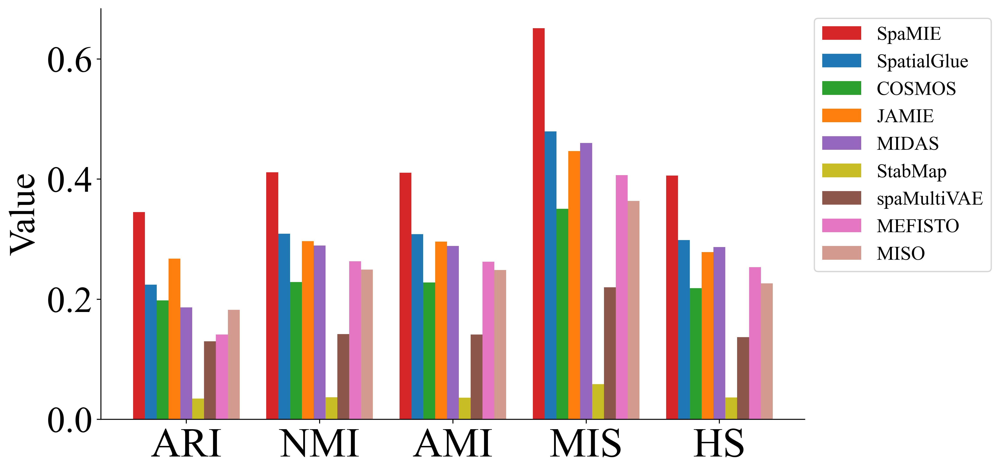

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd

res_all_stack = metric_all.stack().reset_index()
res_all_stack.columns=['Method', 'Metric', 'value']
res_all_stack.set_index('Method')

res_all_stack_RNA = metric_all_RNA.stack().reset_index()
res_all_stack_RNA.columns=['Method', 'Metric', 'value']
res_all_stack_RNA.set_index('Method')

import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12,4)
plt.rcParams['font.size'] = 20
plt.rcParams['font.sans-serif'] = 'Arial'
res_all_stack

mean_data = res_all_stack.groupby(['Method', 'Metric'])['value'].mean().unstack()
std_data = res_all_stack.groupby(['Method', 'Metric'])['value'].std().unstack()

mean_data = mean_data[['SpaMIE', 'SpatialGlue', 'COSMOS','JAMIE','MIDAS','StabMap','spaMultiVAE',  'MEFISTO', 'MISO',]]
std_data = std_data[['SpaMIE', 'SpatialGlue', 'COSMOS','JAMIE','MIDAS','StabMap','spaMultiVAE',  'MEFISTO', 'MISO',]]
mean_data = mean_data.reindex(['ARI','NMI','AMI','MIS','HS'])
std_data = std_data.reindex(['ARI','NMI','AMI','MIS','HS'])

mean_data_RNA = res_all_stack_RNA.groupby(['Method', 'Metric'])['value'].mean().unstack()
std_data_RNA = res_all_stack_RNA.groupby(['Method', 'Metric'])['value'].std().unstack()

mean_data_RNA = mean_data_RNA[['SpaMIE', 'SpatialGlue', 'COSMOS','JAMIE','MIDAS','StabMap','spaMultiVAE',  'MEFISTO', 'MISO',]]
std_data_RNA = std_data_RNA[['SpaMIE', 'SpatialGlue', 'COSMOS','JAMIE','MIDAS','StabMap','spaMultiVAE',  'MEFISTO', 'MISO',]]
mean_data_RNA = mean_data_RNA.reindex(['ARI','NMI','AMI','MIS','HS'])
std_data_RNA = std_data_RNA.reindex(['ARI','NMI','AMI','MIS','HS'])

palette = ['#d62728','#1f77b4','#2ca02c','#ff7f0e','#9467bd' ,"#c8bd25" , "#8c564b", "#e377c2", "#d39b90"] # 自定义颜色
palette1 = ["#b01f1f","#17537f","#1e691e","#91490a","#654782" ,"#928a1c" , "#8c564b", "#e377c2", "#d39b90"] # 自定义颜色
n_methods = len(mean_data.index)
n_metrics = len(mean_data.columns)
bar_width = 0.8/n_metrics  
fig, ax = plt.subplots(figsize=(12, 6), dpi=400)
plt.rcParams.update({
    'font.size': 26,          
    'axes.titlesize': 30,    
    'axes.labelsize': 30,      
    'xtick.labelsize': 34,    
    'ytick.labelsize': 30,     
    'legend.fontsize': 16      
})

for i, metric in enumerate(mean_data.columns):
    x_pos = np.arange(n_methods) + i*bar_width
    ax.bar(
        x=x_pos,
        height=mean_data[metric],
        width=bar_width,
        # yerr=std_data[metric],
        error_kw={'elinewidth': 1, 'capsize': 3},
        label=metric,
        color=palette[i]
    )
    # ax.bar(
    #     x=x_pos,
    #     # bottom=mean_data[metric],
    #     height=mean_data_RNA[metric],
    #     width=bar_width,
    #     # yerr=std_data[metric],
    #     error_kw={'elinewidth': 1, 'capsize': 3},
    #     label=metric,
    #     color=palette[i]
    # )


ax.set_xticks(np.arange(n_methods) + bar_width*(n_metrics-1)/2)
ax.set_xticklabels(mean_data.index, rotation=45)
plt.xticks(rotation=0)
ax.set_xlabel('')
ax.set_ylabel('Value')


ax.legend(
    title='',
    loc='upper left',
    bbox_to_anchor=(1., 1),
    fontsize=16,
    frameon=True
)


sns.despine(top=True, right=True)
plt.tight_layout()
plt.show()

In [5]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
path = '/data/xiangdw/data/data/spots/'
adata1 = sc.read_h5ad(path + 'Spots_method_batch1_inter.h5ad')


adata1.obs['SpaMIE'] = (adata1.obs['SpaMIE'].astype(int) + 1).astype('category')
SpaMIE = np.array(adata1.obs['SpaMIE'], dtype=int).tolist()
swap_dict = {1: 1, 2: 3, 3: 2, 4: 5, 5: 4}
SpaMIE = [swap_dict[category] for category in SpaMIE]
adata1.obs['SpaMIE'] = pd.Categorical(SpaMIE)

adata1.obs['SpatialGlue'] = (adata1.obs['SpatialGlue'].astype(int) + 1).astype('category')
SpatialGlue = np.array(adata1.obs['SpatialGlue'], dtype=int).tolist()
swap_dict = {1: 1, 2: 5, 3: 2, 4: 4, 5: 3}
SpatialGlue = [swap_dict[category] for category in SpatialGlue]
adata1.obs['SpatialGlue'] = pd.Categorical(SpatialGlue)

adata1.obs['COSMOS'] = (adata1.obs['COSMOS'].astype(int) + 1).astype('category')
COSMOS = np.array(adata1.obs['COSMOS'], dtype=int).tolist()
swap_dict = {1: 2, 2: 1, 3: 5, 4: 4, 5: 3}
COSMOS = [swap_dict[category] for category in COSMOS]
adata1.obs['COSMOS'] = pd.Categorical(COSMOS)

adata1.obs['MISO'] = (adata1.obs['MISO'].astype(int) + 1).astype('category')
MISO = np.array(adata1.obs['MISO'], dtype=int).tolist()
swap_dict = {1: 5, 2: 4, 3: 2, 4: 1, 5: 3}
MISO = [swap_dict[category] for category in MISO]
adata1.obs['MISO'] = pd.Categorical(MISO)

adata1.obs['Mefisto'] = (adata1.obs['Mefisto'].astype(int) + 1).astype('category')
Mefisto = np.array(adata1.obs['Mefisto'], dtype=int).tolist()
swap_dict = {1: 5, 2: 1, 3: 2, 4: 4, 5: 3}
MEFISTO= [swap_dict[category] for category in Mefisto]
adata1.obs['Mefisto'] = pd.Categorical(MEFISTO)


SpaMIE = np.array(adata1.obs['SpaMIE'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
SpaMIE = [swap_dict[category] for category in SpaMIE]
adata1.obs['SpaMIE'] = pd.Categorical(SpaMIE)


SpatialGlue = np.array(adata1.obs['SpatialGlue'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
SpatialGlue = [swap_dict[category] for category in SpatialGlue]
adata1.obs['SpatialGlue'] = pd.Categorical(SpatialGlue)

COSMOS = np.array(adata1.obs['COSMOS'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
COSMOS = [swap_dict[category] for category in COSMOS]
adata1.obs['COSMOS'] = pd.Categorical(COSMOS)


Mefisto = np.array(adata1.obs['Mefisto'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
MEFISTO= [swap_dict[category] for category in Mefisto]
adata1.obs['Mefisto'] = pd.Categorical(MEFISTO)

adata1.obs['MIDAS'] = (adata1.obs['MIDAS'].astype(int) + 1).astype('category')
MIDAS = np.array(adata1.obs['MIDAS'], dtype=int).tolist()
swap_dict = {1: 3, 2: 1, 3: 5, 4: 4, 5: 2}
MIDAS = [swap_dict[category] for category in MIDAS]
adata1.obs['MIDAS'] = pd.Categorical(MIDAS)

adata1.obs['JAMIE'] = (adata1.obs['JAMIE'].astype(int) + 1).astype('category')
JAMIE = np.array(adata1.obs['JAMIE'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
JAMIE = [swap_dict[category] for category in JAMIE]
adata1.obs['JAMIE'] = pd.Categorical(JAMIE)



In [6]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
path = '/data/xiangdw/data/data/spots/'
adata2 = sc.read_h5ad(path + 'Spots_method_batch2_inter.h5ad')


adata2.obs['SpaMIE'] = (adata2.obs['SpaMIE'].astype(int) + 1).astype('category')
SpaMIE = np.array(adata2.obs['SpaMIE'], dtype=int).tolist()
swap_dict = {1: 1, 2: 3, 3: 2, 4: 5, 5: 4}
SpaMIE = [swap_dict[category] for category in SpaMIE]
adata2.obs['SpaMIE'] = pd.Categorical(SpaMIE)

adata2.obs['SpatialGlue'] = (adata2.obs['SpatialGlue'].astype(int) + 1).astype('category')
SpatialGlue = np.array(adata2.obs['SpatialGlue'], dtype=int).tolist()
swap_dict = {1: 1, 2: 5, 3: 2, 4: 4, 5: 3}
SpatialGlue = [swap_dict[category] for category in SpatialGlue]
adata2.obs['SpatialGlue'] = pd.Categorical(SpatialGlue)

adata2.obs['COSMOS'] = (adata2.obs['COSMOS'].astype(int) + 1).astype('category')
COSMOS = np.array(adata2.obs['COSMOS'], dtype=int).tolist()
swap_dict = {1: 2, 2: 1, 3: 5, 4: 4, 5: 3}
COSMOS = [swap_dict[category] for category in COSMOS]
adata2.obs['COSMOS'] = pd.Categorical(COSMOS)

adata2.obs['MISO'] = (adata2.obs['MISO'].astype(int) + 1).astype('category')
MISO = np.array(adata2.obs['MISO'], dtype=int).tolist()
swap_dict = {1: 5, 2: 4, 3: 2, 4: 1, 5: 3}
MISO = [swap_dict[category] for category in MISO]
adata2.obs['MISO'] = pd.Categorical(MISO)

adata2.obs['Mefisto'] = (adata2.obs['Mefisto'].astype(int) + 1).astype('category')
Mefisto = np.array(adata2.obs['Mefisto'], dtype=int).tolist()
swap_dict = {1: 5, 2: 1, 3: 2, 4: 4, 5: 3}
MEFISTO= [swap_dict[category] for category in Mefisto]
adata2.obs['Mefisto'] = pd.Categorical(MEFISTO)


SpaMIE = np.array(adata2.obs['SpaMIE'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
SpaMIE = [swap_dict[category] for category in SpaMIE]
adata2.obs['SpaMIE'] = pd.Categorical(SpaMIE)


SpatialGlue = np.array(adata2.obs['SpatialGlue'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
SpatialGlue = [swap_dict[category] for category in SpatialGlue]
adata2.obs['SpatialGlue'] = pd.Categorical(SpatialGlue)

COSMOS = np.array(adata2.obs['COSMOS'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
COSMOS = [swap_dict[category] for category in COSMOS]
adata2.obs['COSMOS'] = pd.Categorical(COSMOS)


Mefisto = np.array(adata2.obs['Mefisto'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
MEFISTO= [swap_dict[category] for category in Mefisto]
adata2.obs['Mefisto'] = pd.Categorical(MEFISTO)

adata2.obs['MIDAS'] = (adata2.obs['MIDAS'].astype(int) + 1).astype('category')
MIDAS = np.array(adata2.obs['MIDAS'], dtype=int).tolist()
swap_dict = {1: 3, 2: 1, 3: 5, 4: 4, 5: 2}
MIDAS = [swap_dict[category] for category in MIDAS]
adata2.obs['MIDAS'] = pd.Categorical(MIDAS)

adata2.obs['JAMIE'] = (adata2.obs['JAMIE'].astype(int) + 1).astype('category')
JAMIE = np.array(adata2.obs['JAMIE'], dtype=int).tolist()
swap_dict = {1: 1, 2: 4, 3: 3, 4: 5, 5: 2}
JAMIE = [swap_dict[category] for category in JAMIE]
adata2.obs['JAMIE'] = pd.Categorical(JAMIE)




/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 

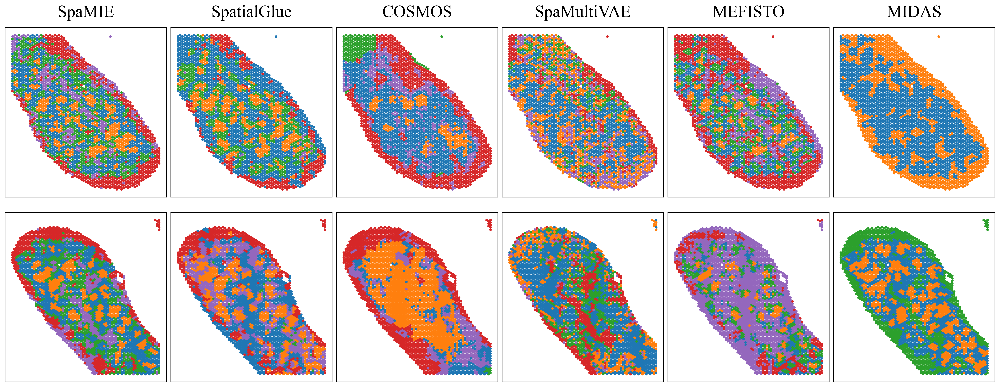

In [9]:
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd

fig, ax_list = plt.subplots(2, 6, figsize=(20, 8),dpi=400)
plt.rcParams['font.size'] = 20
sc.pl.embedding(adata1, basis='spatial', color=['SpaMIE'], ax=ax_list[0,0], title='SpaMIE', s=50, show=False)
sc.pl.embedding(adata1, basis='spatial', color=['SpatialGlue'], ax=ax_list[0,1], title='SpatialGlue', s=50, show=False)
sc.pl.embedding(adata1, basis='spatial', color=['Mefisto'], ax=ax_list[0,4], title='MEFISTO', s=50, show=False)
sc.pl.embedding(adata1, basis='spatial', color=['SpaVAE'], ax=ax_list[0,3], title='spaMultiVAE', s=50, show=False)
sc.pl.embedding(adata1, basis='spatial', color=['COSMOS'], ax=ax_list[0,2], title='COSMOS', s=50, show=False)
sc.pl.embedding(adata1, basis='spatial', color=['MIDAS'], ax=ax_list[0,5], title='MIDAS', s=50, show=False)

sc.pl.embedding(adata2, basis='spatial', color=['SpaMIE'], ax=ax_list[1,0], title='', s=50, show=False)
sc.pl.embedding(adata2, basis='spatial', color=['SpatialGlue'], ax=ax_list[1,1], title='', s=50, show=False)
sc.pl.embedding(adata2, basis='spatial', color=['Mefisto'], ax=ax_list[1,4], title='', s=50, show=False)
sc.pl.embedding(adata2, basis='spatial', color=['SpaVAE'], ax=ax_list[1,3], title='', s=50, show=False)
sc.pl.embedding(adata2, basis='spatial', color=['COSMOS'], ax=ax_list[1,2], title='', s=50, show=False)
sc.pl.embedding(adata2, basis='spatial', color=['MIDAS'], ax=ax_list[1,5], title='', s=50, show=False)

ax_list[0,0].set_title('SpaMIE', pad=15)
ax_list[0,1].set_title('SpatialGlue', pad=15)
ax_list[0,2].set_title('COSMOS', pad=15)
ax_list[0,4].set_title('MEFISTO', pad=15)
ax_list[0,5].set_title('MIDAS', pad=15)
ax_list[0,3].set_title('SpaMultiVAE', pad=15)



# remove x, y axis
ax_list[0, 0].set_xlabel('')
ax_list[0, 1].set_xlabel('')
ax_list[0, 2].set_xlabel('')
ax_list[0, 3].set_xlabel('')
ax_list[0, 4].set_xlabel('')
ax_list[0, 5].set_xlabel('')

ax_list[1, 0].set_xlabel('')
ax_list[1, 1].set_xlabel('')
ax_list[1, 2].set_xlabel('')
ax_list[1, 3].set_xlabel('')
ax_list[1, 4].set_xlabel('')
ax_list[1, 5].set_xlabel('')

ax_list[0, 0].set_ylabel('')
ax_list[0, 1].set_ylabel('')
ax_list[0, 2].set_ylabel('')
ax_list[0, 3].set_ylabel('')
ax_list[0, 4].set_ylabel('')
ax_list[0, 5].set_ylabel('')
ax_list[1, 0].set_ylabel('')
ax_list[1, 1].set_ylabel('')
ax_list[1, 2].set_ylabel('')
ax_list[1, 3].set_ylabel('')
ax_list[1, 4].set_ylabel('')
ax_list[1, 5].set_ylabel('')

ax_list[0,0].get_legend().remove()
ax_list[0,1].get_legend().remove()
ax_list[0,2].get_legend().remove()
ax_list[0,3].get_legend().remove()
ax_list[0,4].get_legend().remove()
ax_list[0,5].get_legend().remove()
ax_list[1,0].get_legend().remove()
ax_list[1,1].get_legend().remove()
ax_list[1,2].get_legend().remove() 
ax_list[1,3].get_legend().remove()
ax_list[1,4].get_legend().remove()
ax_list[1,5].get_legend().remove()


plt.tight_layout(w_pad=.3)
plt.show()


/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/data/xiangdw/conda_env/GNNS/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 

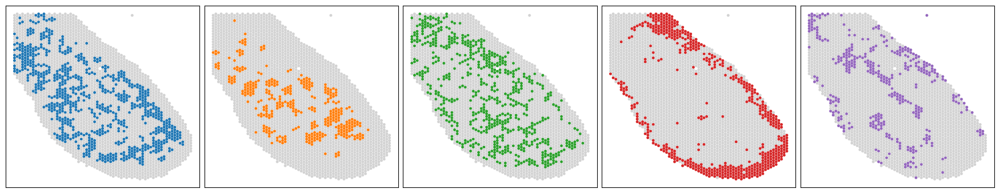

In [ ]:
import matplotlib.pyplot as plt
import scanpy as sc

categories = adata1.obs['SpaMIE'].cat.categories
original_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b'] 


fig, ax_list = plt.subplots(1, 5, figsize=(18, 3.8))  
plt.rcParams['font.size'] = 20

for i, (category, ax) in enumerate(zip(categories, ax_list)):

    new_colors = ['lightgrey'] * len(categories)
    new_colors[i] = original_colors[i]  

    adata1.uns['SpaMIE_colors'] = new_colors
    sc.pl.embedding(
        adata1,
        basis='spatial',
        color='SpaMIE',  
        ax=ax,
        title='',  
        s=50,
        show=False
    )
    


# remove legend
ax_list[0].get_legend().remove()
ax_list[1].get_legend().remove()
ax_list[2].get_legend().remove()
ax_list[3].get_legend().remove()
ax_list[4].get_legend().remove()


# remove x, y axis
ax_list[ 0].set_xlabel('')
ax_list[ 1].set_xlabel('')
ax_list[ 2].set_xlabel('')
ax_list[ 3].set_xlabel('')
ax_list[ 4].set_xlabel('')


ax_list[ 0].set_ylabel('')
ax_list[ 1].set_ylabel('')
ax_list[ 2].set_ylabel('')
ax_list[ 3].set_ylabel('')
ax_list[ 4].set_ylabel('')


plt.tight_layout(w_pad=.3)
plt.show()